In [1]:
import pixelator
import anndata

import os
from pathlib import Path

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

from pixelator.plot import molecule_rank_plot, cell_count_plot, scatter_umi_per_upia_vs_tau
from pixelator import simple_aggregate

import scanpy as sc

import torch

print(torch.cuda.is_available())

%load_ext autoreload
%autoreload 2

True


In [2]:
adata = anndata.read_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/combined_resting_PHA_data_PROCESSED_WITH_ASYMM_COLOC_NO_OVERLAP.h5ad')

In [3]:
resting_adata = adata[adata.obs[adata.obs['sample_class'] == 'resting'].index, :]

In [3]:
adata.to_df()

marker,B2M,CD102,CD11a,CD11b,CD11c,CD14,CD150,CD152,CD154,CD158,...,CD84,CD86,CD9,HLA-ABC,HLA-DR,TCRVB5,ACTB,mIgG1,mIgG2a,mIgG2b
component,,,,,,,,,,,,,,,,,,,,,
RCVCMP0000000_resting_r1,3.874444,1.506085,1.811198,0.595766,2.057586,0.407282,0.208034,0.122845,0.271318,0.286532,...,0.263623,1.290415,0.521000,3.030955,2.160057,0.174824,0.515010,0.131698,0.199834,0.140473
RCVCMP0000001_resting_r1,3.515868,0.646135,1.261646,0.919144,0.394107,0.561655,0.700333,0.184723,0.284036,0.561655,...,0.319752,0.143736,0.312710,2.544616,0.463314,0.135333,0.522326,0.208532,0.192722,0.109692
RCVCMP0000002_resting_r1,3.581688,0.367271,1.193497,0.506814,0.335237,0.390640,0.293696,0.176845,0.343342,0.285176,...,0.335237,0.186335,0.375121,2.825773,3.516598,0.259174,0.435801,0.176845,0.302143,0.176845
RCVCMP0000004_resting_r1,3.632140,0.388653,0.765906,0.986093,0.284307,0.297961,0.400962,0.227745,0.256426,0.376189,...,0.677146,0.242188,0.815611,2.697855,0.494338,0.284307,0.448739,0.213090,0.242188,0.136410
RCVCMP0000005_resting_r1,3.468685,0.717180,0.746073,0.617683,0.416995,0.311116,0.481825,0.266121,0.244651,0.382933,...,0.344401,0.287140,0.584766,2.355565,0.803539,0.262575,0.602625,0.192686,0.321219,0.185036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RCVCMP0001931_stimulated_r2,4.132790,0.872288,1.018659,0.528384,0.743031,0.298692,0.231961,0.340827,0.254703,0.420118,...,0.109779,0.160457,0.400877,3.065750,0.438996,0.160457,1.208852,0.184864,0.276939,0.184864
RCVCMP0001967_stimulated_r2,4.693611,0.198334,1.098181,0.548834,0.534655,0.237535,1.941865,0.293596,0.329297,0.329297,...,0.256573,0.829358,0.346681,4.201138,3.328964,0.237535,2.099990,0.178143,0.198334,0.198334
RCVCMP0002036_stimulated_r2,4.205702,0.360382,1.178123,0.816332,0.439678,0.146499,0.387519,0.212414,0.180000,0.274253,...,0.303794,0.180000,0.146499,3.235357,0.489251,0.075930,1.281840,0.111837,0.111837,0.111837


In [5]:
sc.pp.pca(resting_adata, layer='clr')
sc.pp.neighbors(resting_adata, n_neighbors=15, n_pcs=20)
sc.tl.umap(resting_adata)
sc.tl.leiden(resting_adata, resolution=1)
sc.tl.leiden(resting_adata, resolution=0.1, restrict_to=('leiden', ['11']))

/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
/tmp/ipykernel_3839573/2535636304.py:4: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(resting_adata, resolution=1)


In [6]:
resting_adata.obs['leiden_R'].value_counts()

leiden_R
0       306
1       256
2       251
3       159
4       144
5       141
6       131
7       117
8        87
9        85
10       82
11,0     57
12       48
13       37
14       27
15       27
11,1     21
16       13
Name: count, dtype: int64

In [20]:

[var_name for var_name in resting_adata.var_names.values if 'CD40' in var_name]

['CD40']

In [8]:
adata.var_names

Index(['B2M', 'CD102', 'CD11a', 'CD11b', 'CD11c', 'CD14', 'CD150', 'CD152',
       'CD154', 'CD158', 'CD16', 'CD161', 'CD162', 'CD18', 'CD19', 'CD1d',
       'CD2', 'CD20', 'CD200', 'CD22', 'CD229', 'CD244', 'CD25', 'CD26',
       'CD268', 'CD27', 'CD274', 'CD278', 'CD279', 'CD29', 'CD32', 'CD328',
       'CD33', 'CD337', 'CD35', 'CD36', 'CD37', 'CD38', 'CD3E', 'CD4', 'CD40',
       'CD41', 'CD43', 'CD44', 'CD45', 'CD45RA', 'CD45RB', 'CD47', 'CD48',
       'CD49D', 'CD5', 'CD50', 'CD52', 'CD53', 'CD54', 'CD55', 'CD59', 'CD62P',
       'CD64', 'CD69', 'CD7', 'CD71', 'CD72', 'CD8', 'CD82', 'CD84', 'CD86',
       'CD9', 'HLA-ABC', 'HLA-DR', 'TCRVB5', 'ACTB', 'mIgG1', 'mIgG2a',
       'mIgG2b'],
      dtype='object', name='marker')

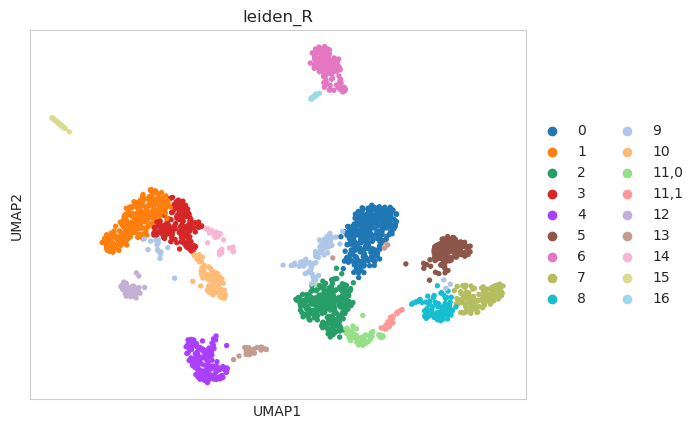

In [35]:
sc.pl.umap(resting_adata, color=['leiden_R'])

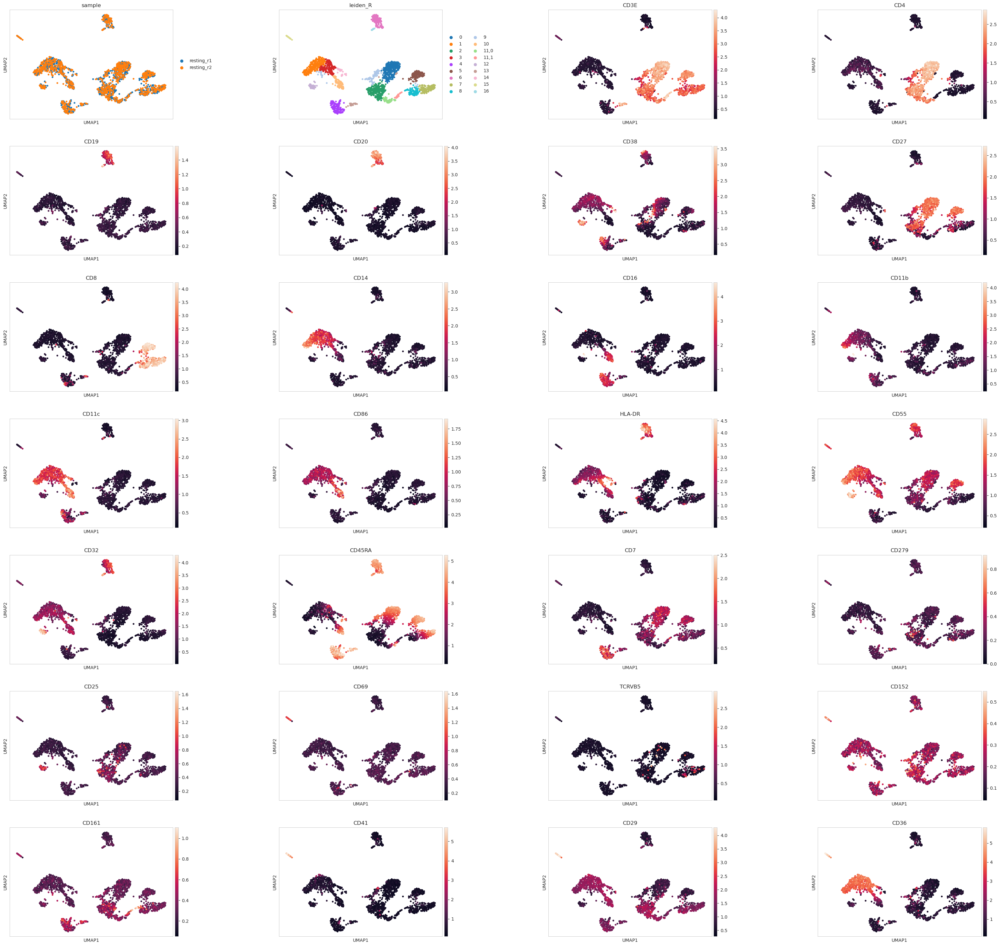

In [9]:
sc.pl.umap(resting_adata, color=['sample', 'leiden_R', 'CD3E', 'CD4', 'CD19', 'CD20', 'CD38', 'CD27', 'CD8', 'CD14', 
                                 'CD16', 'CD11b', 'CD11c', 'CD86', 'HLA-DR',
                                 'CD55', 'CD32', 'CD45RA', 'CD7', 'CD279', 'CD25', 'CD69', 'TCRVB5', 'CD152', 'CD161',
                                 'CD41', 'CD29', 'CD36'], wspace=0.5)

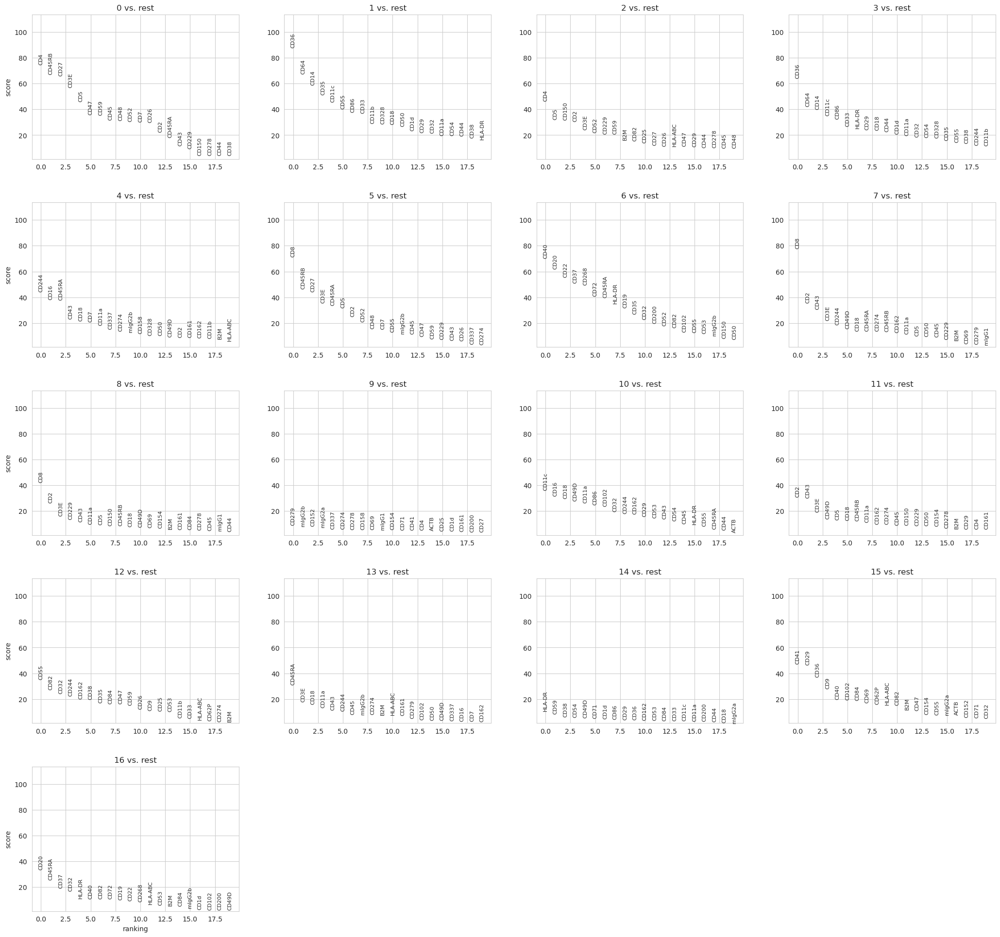

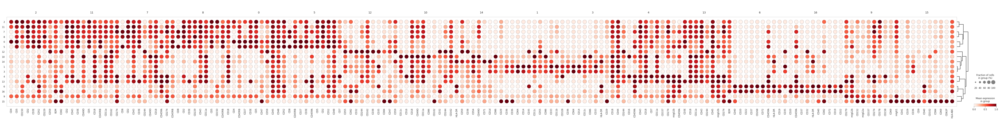

In [10]:
sc.tl.rank_genes_groups(resting_adata, groupby='leiden')
sc.pl.rank_genes_groups(resting_adata)
sc.tl.dendrogram(resting_adata, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(resting_adata, standard_scale='var')

In [32]:
resting_annot_dict = {
    '0': 'T_Helper_Naive',       # CD4, CD3E, CD45RA
    '1': 'Classical_Monocytes',  # CD14, ~CD16, 
    '2': 'T_Helper_Memory',      # CD4, CD3E, ~CD45RA,
    '3': 'Intermediate_Monocytes',  # Intermediate CD14, Low/~ CD16, 
    '4': 'NK',                  # CD161, CD7, ~CD3E, CD16
    '5': 'Cytotoxic_Naive_T',   # CD8, CD45RA, CD3E
    '6': 'B',                    # CD19, CD20
    '7': 'Cytotoxic_Effector_T', # CD8, CD45RA, CD69, ~CD27
    '8': 'Cytotoxic_Memory_T',     #CD8, ~CD45RA, CD3E,
    '9': 'T_Helper_Naive',        # Cluster was weird
    '10': 'Nonclassical_Monocytes', # ~CD14, CD16
    '11,0': 'T_Helper_Memory',      # 
    '11,1': 'Cytotoxic_Memory_T',
    '12': 'Granulocytes',          # CD55, CD82, CD32
    '13': 'NKT',                   # CD161, CD7, CD3E
    '14': 'Dendritic',             # CD11c, HLA-DR, ~CD14
    '15': 'Platelets',             # CD41
    '16': 'B',
}

high_res_to_low_res = {
    'Classical_Monocytes': 'Myeloid',
    'Nonclassical_Monocytes': 'Myeloid',
    'Intermediate_Monocytes': 'Myeloid',
    'Dendritic': 'Myeloid',
    'Granulocytes': 'Myeloid',
    'Cytotoxic_Memory_T': 'Cytotoxic_T',
    'Cytotoxic_Effector_T': 'Cytotoxic_T',
    'Cytotoxic_Naive_T': 'Cytotoxic_T',
    'Cytotoxic_Activated_T': 'Cytotoxic_T', # I added
    'Gamma_Delta_T': 'Gamma_Delta_T',
    'T_Helper_Naive': 'T_Helper',
    'T_Helper_Memory': 'T_Helper',
    'T_Helper_Activated': 'T_Helper',
    'T_Regulatory_Activated': 'T_Regulatory',
    'T_Regulatory': 'T_Regulatory',
    'B': 'B',
    'B_Transitional': 'B',
    'Platelets': 'Platelets',
    'NKT': 'Innate_Lymphocytes',
    'NK': 'Innate_Lymphocytes', 
}

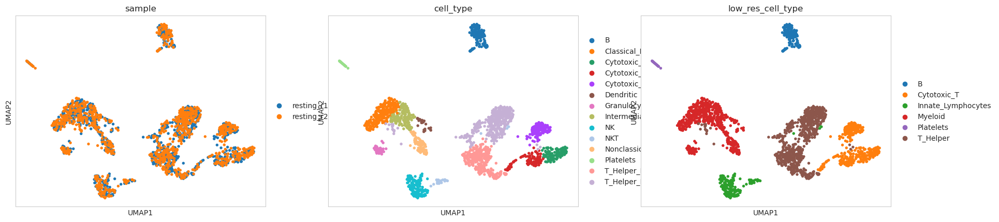

In [12]:
resting_adata.obs['cell_type'] = resting_adata.obs['leiden_R'].map(resting_annot_dict)
resting_adata.obs['low_res_cell_type'] = resting_adata.obs['cell_type'].map(high_res_to_low_res)
sc.pl.umap(resting_adata, color=['sample', 'cell_type', 'low_res_cell_type'])

In [13]:
stim_adata = adata[adata.obs[adata.obs['sample_class'] == 'stimulated'].index, :]

In [14]:
sc.pp.pca(stim_adata, layer='clr')
sc.pp.neighbors(stim_adata, n_neighbors=15, n_pcs=20)
sc.tl.umap(stim_adata)
sc.tl.leiden(stim_adata, resolution=1)
sc.tl.leiden(stim_adata, resolution=0.5, restrict_to=('leiden', ['12']))
sc.tl.leiden(stim_adata, resolution=0.5, restrict_to=('leiden_R', ['6']), key_added='leiden_R')
sc.tl.leiden(stim_adata, resolution=0.5, restrict_to=('leiden_R', ['1']), key_added='leiden_R')
sc.tl.dendrogram(stim_adata, groupby='leiden_R')
sc.tl.rank_genes_groups(stim_adata, groupby='leiden_R')

/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


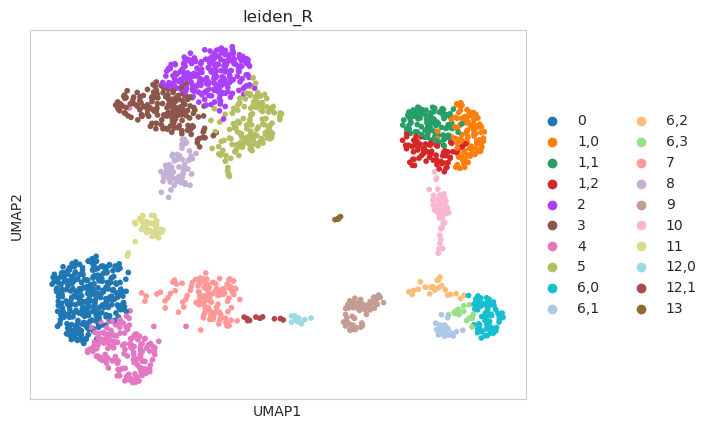

In [15]:
sc.pl.umap(stim_adata, color=['leiden_R'])

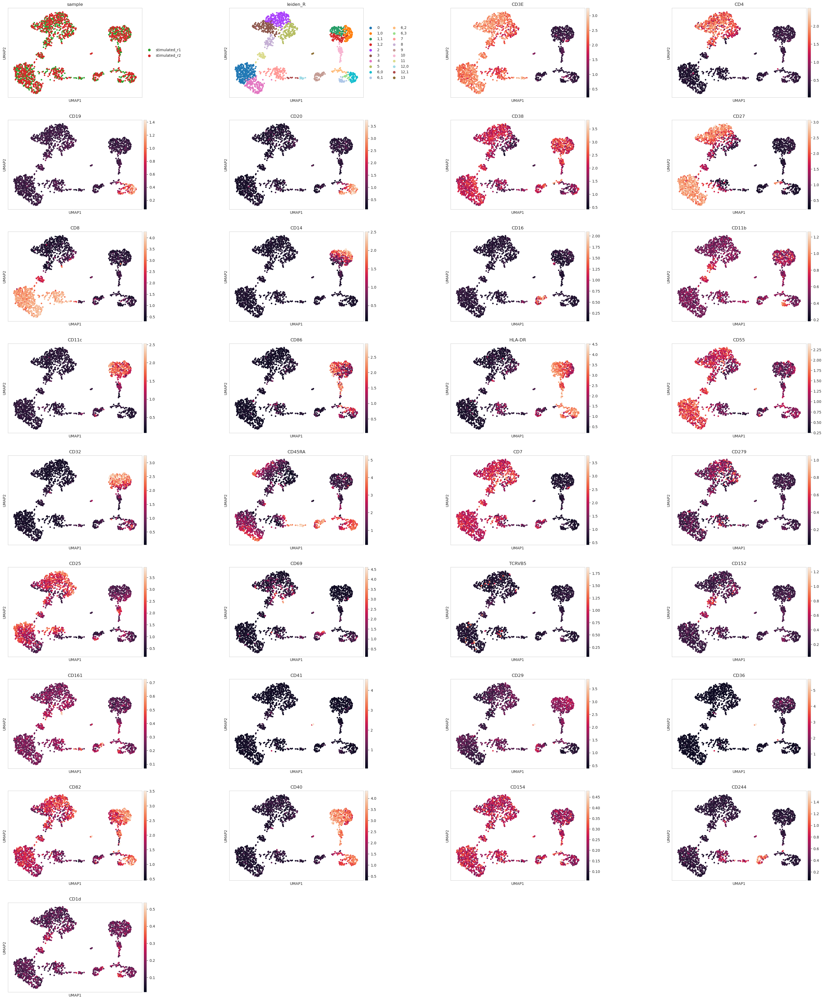

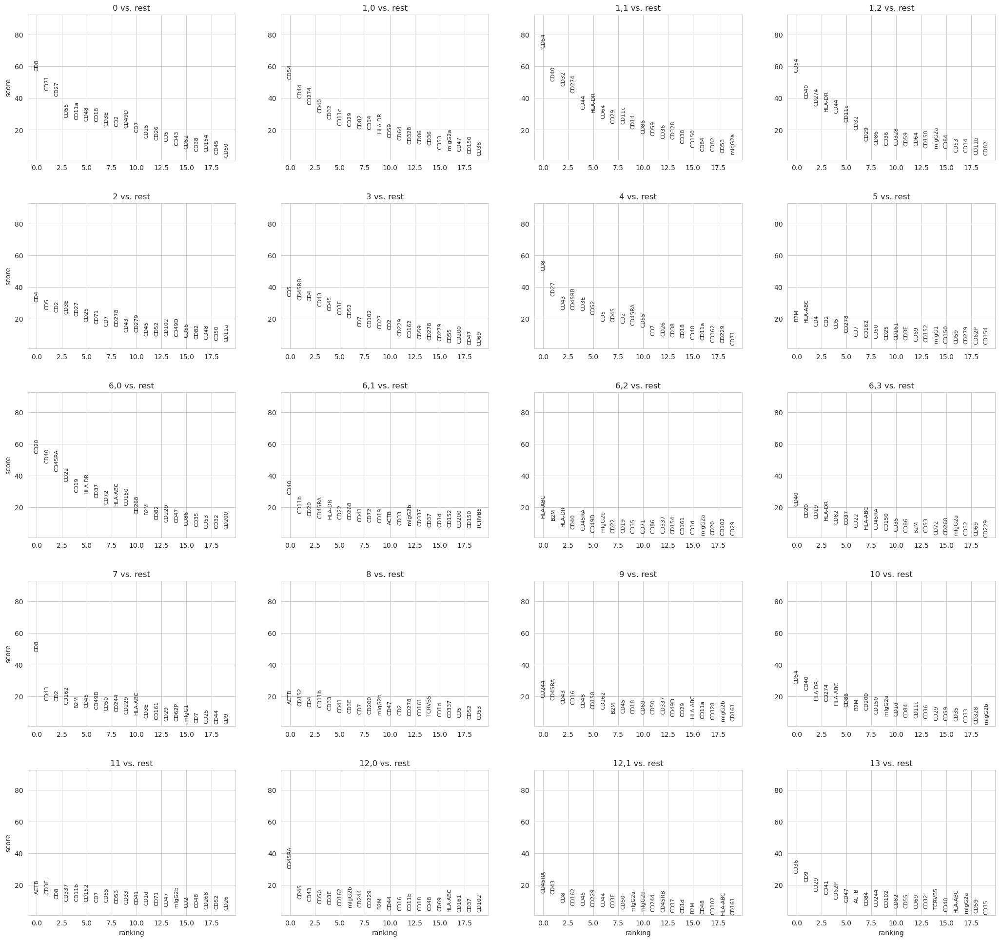

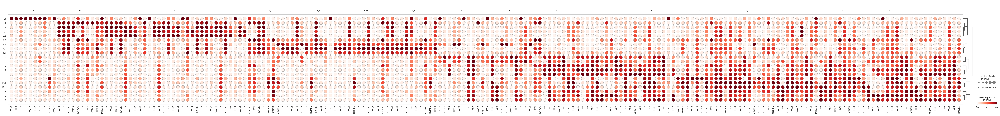

In [30]:
sc.pl.umap(stim_adata, color=['sample', 'leiden_R', 'CD3E', 'CD4', 'CD19', 'CD20', 'CD38', 'CD27', 'CD8', 'CD14', 
                                 'CD16', 'CD11b', 'CD11c', 'CD86', 'HLA-DR',
                                 'CD55', 'CD32', 'CD45RA', 'CD7', 'CD279', 'CD25', 'CD69', 'TCRVB5', 'CD152', 'CD161',
                                 'CD41', 'CD29', 'CD36', 'CD82', 'CD40', 'CD154', 'CD244', 'CD1d'], wspace=0.5)
sc.pl.rank_genes_groups(stim_adata)
sc.pl.rank_genes_groups_dotplot(stim_adata, standard_scale='var')

In [17]:
# resting_annot_dict = {
#     '0': 'T_Helper_Naive',       # CD4, CD3E, CD45RA
#     '1': 'Classical_Monocytes',  # CD14, ~CD16, 
#     '2': 'T_Helper_Memory',      # CD4, CD3E, ~CD45RA,
#     '3': 'Intermediate_Monocytes',  # Intermediate CD14, Low/~ CD16, 
#     '4': 'NK',                  # CD161, CD7, ~CD3E, CD16
#     '5': 'Cytotoxic_Naive_T',   # CD8, CD45RA, CD3E
#     '6': 'B',                    # CD19, CD20
#     '7': 'Cytotoxic_Effector_T', # CD8, CD45RA, CD69, ~CD27
#     '8': 'Cytotoxic_Memory_T',     #CD8, ~CD45RA, CD3E,
#     '9': 'T_Helper_Naive',        # Cluster was weird
#     '10': 'Nonclassical_Monocytes', # ~CD14, CD16
#     '11,0': 'T_Helper_Memory',      # 
#     '11,1': 'Cytotoxic_Memory_T',
#     '12': 'Granulocytes',          # CD55, CD82, CD32
#     '13': 'NKT',                   # CD161, CD7, CD3E
#     '14': 'Dendritic',             # CD11c, HLA-DR, ~CD14
#     '15': 'Platelets',             # CD41
#     '16': 'B',
# }

In [ ]:
stim_annot_dict = {
    '0': 'Cytotoxic_Memory_T',
    '1,0': 'Classical_Monocytes',
    '1,1': 'Intermediate_Monocytes',
    '1,2': 'Nonclassical_Monocytes',
    '2': 'T_Helper_Activated', # Unsure, maybe Tregs?
    '3': 'T_Helper_Naive',
    '4': 'Cytotoxic_Naive_T',
    '5': 'T_Helper_Memory',
    '6,0': 'B',
    '6,1': 'B',
    '6,2': 'B_Transitional',  # Low CD19, CD29, High HLA-DR
    '6,3': 'B',
    '7': 'Cytotoxic_Effector_T',
    '8': 'T_Helper_Activated', # Changed from Reg to H for consistency
    '9': 'NK',
    '10': 'Dendritic',
    '11': 'Cytotoxic_Activated_T', # ??CD38, CD152, and CD11b suggest activation, maybe regulatory CD8 because of CD55?
    '12,0': 'NKT',   # CD45RA, ~CD4, ~CD8
    '12,1': 'Cytotoxic_Effector_T',
    '13': 'Platelets',
}

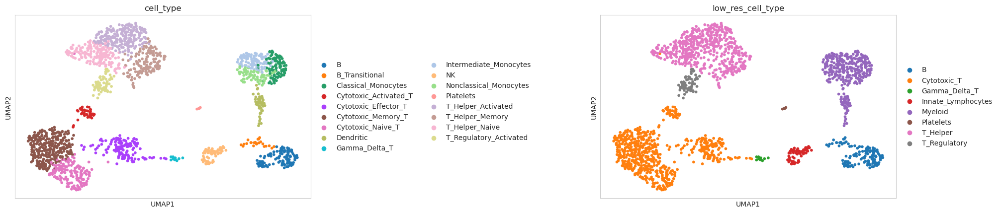

In [34]:
stim_adata.obs['cell_type'] = stim_adata.obs['leiden_R'].map(stim_annot_dict)
stim_adata.obs['low_res_cell_type'] = stim_adata.obs['cell_type'].map(high_res_to_low_res)
sc.pl.umap(stim_adata, color=['cell_type', 'low_res_cell_type'], wspace=0.8)

In [38]:
resting_adata.obs.rename(columns={'leiden_R': 'leiden_resting'}, inplace=True)
stim_adata.obs.rename(columns={'leiden_R': 'leiden_stim'}, inplace=True)

In [ ]:
# resting_adata.write_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/resting_annotated_with_asymm_coloc.h5ad')
# stim_adata.write_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/stim_annotated_with_asymm_coloc.h5ad')

In [2]:
resting_adata = anndata.read_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/resting_annotated_with_asymm_coloc.h5ad')
stim_adata = anndata.read_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/stim_annotated_with_asymm_coloc.h5ad')

### CD4/CD8 confusion alludes to background expression

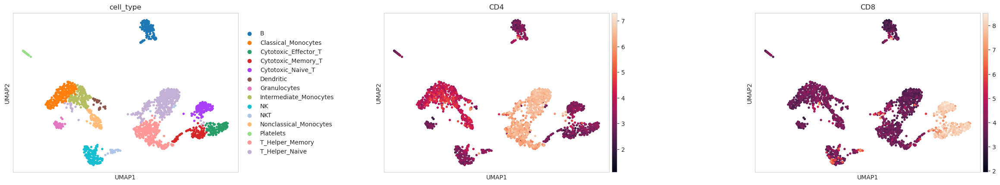

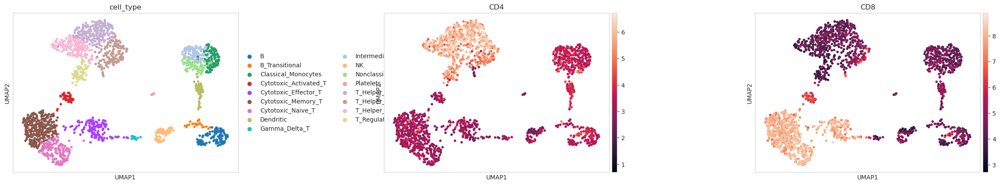

In [4]:
sc.pl.umap(resting_adata, color=['cell_type', 'CD4', 'CD8'], layer='log1p', wspace=0.5)
sc.pl.umap(stim_adata, color=['cell_type', 'CD4', 'CD8'], layer='log1p', wspace=0.5)